# Mask Real Time Detection Project

In [68]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# import needed liberaries 

In [69]:
import os
from shutil import copyfile
import random
import shutil
from google.colab import files
import numpy as np

import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras import layers
from tensorflow.keras.layers import Input, Add, Dense, Activation, ZeroPadding2D, BatchNormalization, Flatten, Conv2D, AveragePooling2D, MaxPooling2D, GlobalMaxPooling2D, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.initializers import random_uniform, glorot_uniform, constant, identity
from tensorflow.python.framework.ops import EagerTensor
from tensorflow.keras.applications import ResNet50
from tensorflow.python.keras.models import Sequential
from tensorflow.python.keras.layers import Flatten, GlobalAveragePooling2D
from sklearn.datasets import load_files


import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import matplotlib.image as mpimg
from PIL import Image
import seaborn as sns

%matplotlib inline
sns.set()

# read data from drive directory

In [70]:
# Assign training and test set directories
root_dir = '/content/drive/MyDrive/maskdata'
train_dir = os.path.join(root_dir, 'train')
test_dir = os.path.join(root_dir, 'test')
validation_dir=os.path.join(root_dir,'validation')


# Directory with training people with mask pictures
train_withmask_dir = os.path.join(train_dir, 'with_mask')
# Directory with training people without mask pictures
train_withoutmask_dir = os.path.join(train_dir, 'without_mask')

# Directory with test people with mask pictures
test_withmask_dir = os.path.join(test_dir, 'with_mask')
# Directory with test people without mask pictures
test_withoutmask_dir = os.path.join(test_dir, 'without_mask')

# Directory with validation people with mask pictures
val_withmask_dir = os.path.join(validation_dir, 'with_mask')
# Directory with validation people without mask pictures
val_withoutmask_dir = os.path.join(validation_dir, 'without_mask')



In [71]:
print(f"There are {len(os.listdir(train_withmask_dir))} images of people wearing masks for train")
print(f"There are {len(os.listdir(train_withoutmask_dir))} images of people without masks for train")

print(f"There are {len(os.listdir(test_withmask_dir))} images of people wearing masks for test")
print(f"There are {len(os.listdir(test_withoutmask_dir))} images of without masks for test")


print(f"There are {len(os.listdir(val_withmask_dir))} images of people wearing masks for validation")
print(f"There are {len(os.listdir(val_withoutmask_dir))} images of without masks for validation")


There are 341 images of people wearing masks for train
There are 275 images of people without masks for train
There are 66 images of people wearing masks for test
There are 132 images of without masks for test
There are 62 images of people wearing masks for validation
There are 75 images of without masks for validation


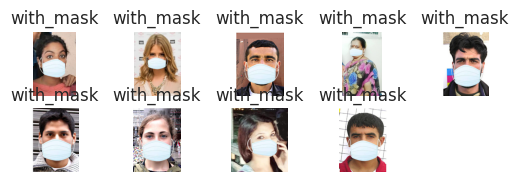

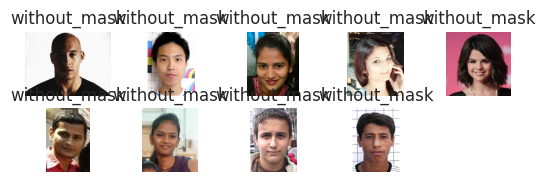

In [72]:
# get all subdirectories in directory
subdirs = [subdir for subdir in os.listdir(train_dir) if os.path.isdir(os.path.join(train_dir, subdir))]

# loop through subdirectories
for subdir in subdirs:
    # get all files in subdirectory
    files = os.listdir(os.path.join(train_dir, subdir))

    # plot first 25 files in subdirectory
    for i in range(9):
        img = Image.open(os.path.join(train_dir, subdir, files[i]))
        plt.subplot(5, 5, i+1)
        plt.imshow(img)
        plt.title(subdir)
        plt.axis('off')

    plt.show()

# prepare data for training 

In [73]:
def train_val_generators(TRAINING_DIR,TEST_DIR, VALIDATION_DIR):
  # rescale images 
  train_datagen = tf.keras.preprocessing.image.ImageDataGenerator( rescale=1./255)
  train_generator = train_datagen.flow_from_directory(directory=TRAINING_DIR,
                                                      batch_size=32,
                                                      class_mode='categorical',
                                                      target_size=(48, 48),shuffle=False)
  

  test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1.0/255)
  test_generator = test_datagen.flow_from_directory(directory=TEST_DIR,
                                                      batch_size=32,
                                                      class_mode='categorical',
                                                      target_size=(48, 48),shuffle=False)
  
  val_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1.0/255)
  val_generator = test_datagen.flow_from_directory(directory=VALIDATION_DIR,
                                                      batch_size=32,
                                                      class_mode='categorical',
                                                      target_size=(48, 48),shuffle=False)
  
  return train_generator, test_generator ,val_generator

In [74]:
train_generator, test_generator , val_generator= train_val_generators(train_dir, test_dir,validation_dir)

# get a batch of images from the generator
train_images, train_labels = train_generator.next()
test_images, test_labels = test_generator.next()
print(type(train_images))
print(type(train_labels))
print(train_images.shape)
print(train_labels.shape)
     

Found 616 images belonging to 2 classes.
Found 198 images belonging to 2 classes.
Found 137 images belonging to 2 classes.
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
(32, 48, 48, 3)
(32, 2)


# DenseNET121 Model

In [75]:
def DenseNet121(input_shape = (224, 224, 3), classes = 2):
    
  # Create an instance of a pre-trained model - DenseNet121
  base_model = tf.keras.applications.DenseNet121(input_shape=input_shape, include_top=False, weights='imagenet')

  # Freeze the top layers of the pre-trained model
  for layer in base_model.layers:
      layer.trainable = False

  # Add a dense layer and dropout layer
  x = base_model.output
  x = tf.keras.layers.GlobalAveragePooling2D()(x)
  x = Dense(256, activation='relu')(x)
  x = Dropout(0.5)(x)
  predictions = Dense(classes, activation='sigmoid')(x)

  # Create the  model
  model = Model(inputs=base_model.input, outputs=predictions)

  # Compile the model
  model.compile(optimizer='Adam', loss='binary_crossentropy', metrics=['accuracy'])

  return model

model = DenseNet121()
model.summary()
     

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_8 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d_4 (ZeroPadding2  (None, 230, 230, 3)  0          ['input_8[0][0]']                
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (None, 112, 112, 64  9408        ['zero_padding2d_4[0][0]']       
                                )                                                           

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.687516 to fit



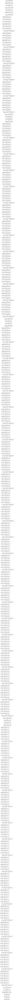

In [76]:
tf.keras.utils.plot_model(model, to_file='model_3.png', show_shapes=True, show_layer_names=True)

In [77]:
# Define early stopping callback
early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=2)

# Train the model
history = model.fit(train_generator,
                    epochs=15,
                    batch_size=10,
                    validation_data=test_generator,
                    callbacks=[early_stop])

Epoch 1/15
20/20 [==============================] - 31s 645ms/step - loss: 0.6742 - accuracy: 0.7013 - val_loss: 0.3492 - val_accuracy: 0.8687
Epoch 2/15
20/20 [==============================] - 8s 381ms/step - loss: 0.3291 - accuracy: 0.8685 - val_loss: 0.2986 - val_accuracy: 0.8737
Epoch 3/15
20/20 [==============================] - 10s 515ms/step - loss: 0.2152 - accuracy: 0.9156 - val_loss: 0.3038 - val_accuracy: 0.8889
Epoch 4/15
20/20 [==============================] - 11s 556ms/step - loss: 0.1930 - accuracy: 0.9221 - val_loss: 0.2410 - val_accuracy: 0.9091
Epoch 5/15
20/20 [==============================] - 8s 424ms/step - loss: 0.1476 - accuracy: 0.9464 - val_loss: 0.2132 - val_accuracy: 0.9040
Epoch 6/15
20/20 [==============================] - 9s 454ms/step - loss: 0.1220 - accuracy: 0.9513 - val_loss: 0.2183 - val_accuracy: 0.9141
Epoch 7/15
20/20 [==============================] - 11s 575ms/step - loss: 0.1099 - accuracy: 0.9513 - val_loss: 0.2002 - val_accuracy: 0.9091
Ep

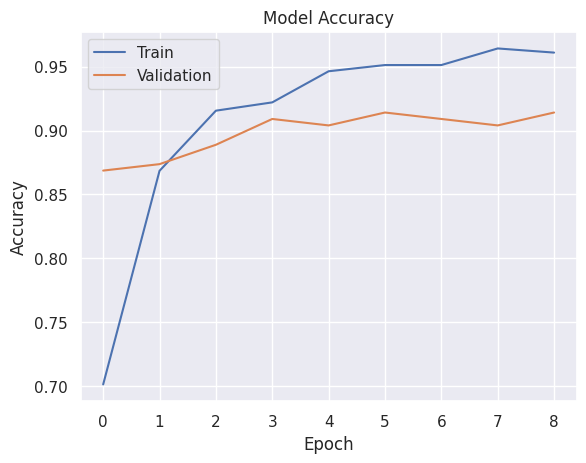

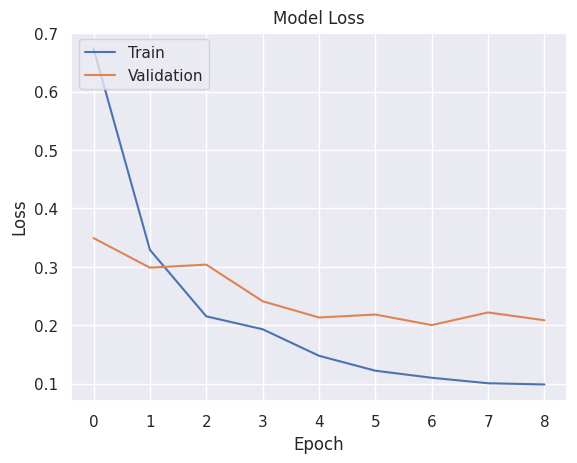

In [78]:
# Plot the training and validation accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot the training and validation loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()
     

In [79]:
test_generator.reset()
y_pred = model.predict(test_generator)
y_true = test_generator.classes

7/7 [==============================] - 6s 256ms/step


In [80]:
from sklearn.metrics import accuracy_score
accuracy_score(y_true,  y_pred.argmax(axis=1))
#train accuracy

0.9141414141414141

In [81]:
# Print precision, recall, and F1-score for all classes
from sklearn.metrics import classification_report

test_generator.reset()
y_pred = model.predict(test_generator)
y_true = test_generator.classes
class_labels = list(test_generator.class_indices.keys())
print(classification_report(y_true, y_pred.argmax(axis=1), target_names=class_labels))

7/7 [==============================] - 3s 435ms/step
              precision    recall  f1-score   support

   with_mask       0.84      0.92      0.88        66
without_mask       0.96      0.91      0.93       132

    accuracy                           0.91       198
   macro avg       0.90      0.92      0.91       198
weighted avg       0.92      0.91      0.92       198



In [82]:
train_generator.reset()
y_pred2 = model.predict(train_generator)
y_true2 = train_generator.classes

20/20 [==============================] - 7s 312ms/step


In [83]:
from sklearn.metrics import accuracy_score
accuracy_score(y_true2,  y_pred2.argmax(axis=1))
#validation accuracy 

0.9902597402597403

In [84]:
# Print precision, recall, and F1-score for all classes
from sklearn.metrics import classification_report

train_generator.reset()
y_pred2 = model.predict(train_generator)
y_true2 = train_generator.classes
class_labels = list(train_generator.class_indices.keys())
print(classification_report(y_true2, y_pred2.argmax(axis=1), target_names=class_labels))

20/20 [==============================] - 7s 318ms/step
              precision    recall  f1-score   support

   with_mask       0.99      0.99      0.99       341
without_mask       0.99      0.99      0.99       275

    accuracy                           0.99       616
   macro avg       0.99      0.99      0.99       616
weighted avg       0.99      0.99      0.99       616



In [85]:
val_generator.reset()
y_predict = model.predict(val_generator)
y_true_ = val_generator.classes

5/5 [==============================] - 3s 516ms/step


In [86]:
from sklearn.metrics import accuracy_score
accuracy_score(y_true_,  y_predict.argmax(axis=1))
#validation accuracy 

0.8467153284671532

In [87]:
# Print precision, recall, and F1-score for all classes
from sklearn.metrics import classification_report

val_generator.reset()
y_predict = model.predict(val_generator)
y_true_ = val_generator.classes
class_labels = list(val_generator.class_indices.keys())
print(classification_report(y_true_, y_predict.argmax(axis=1), target_names=class_labels))

5/5 [==============================] - 3s 497ms/step
              precision    recall  f1-score   support

   with_mask       0.90      0.74      0.81        62
without_mask       0.81      0.93      0.87        75

    accuracy                           0.85       137
   macro avg       0.86      0.84      0.84       137
weighted avg       0.85      0.85      0.84       137



# ResNET Model

In [88]:
my_new_model = Sequential()
my_new_model.add(ResNet50(include_top=False, pooling='avg'))
my_new_model.add(Dense(2, activation='sigmoid'))

my_new_model.layers[0].trainable = False
# remove first layer to train it not to use the pretrained 

In [89]:
my_new_model.compile(optimizer='sgd', loss='binary_crossentropy', metrics=['accuracy'])

In [90]:
history2=my_new_model.fit_generator(
        train_generator,
        steps_per_epoch=4,epochs=10,
        validation_data=test_generator,
        validation_steps=1)

/usr/local/lib/python3.9/dist-packages/tensorflow/python/keras/engine/training.py:1961: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/10
4/4 [==============================] - 8s 968ms/step - loss: 0.5732 - accuracy: 0.8047 - val_loss: 0.5278 - val_accuracy: 1.0000
Epoch 2/10
4/4 [==============================] - 4s 1s/step - loss: 0.1888 - accuracy: 1.0000 - val_loss: 1.0151 - val_accuracy: 0.0625
Epoch 3/10
4/4 [==============================] - 3s 599ms/step - loss: 1.0517 - accuracy: 0.6641 - val_loss: 0.6203 - val_accuracy: 1.0000
Epoch 4/10
4/4 [==============================] - 2s 501ms/step - loss: 0.8942 - accuracy: 0.5469 - val_loss: 0.1230 - val_accuracy: 1.0000
Epoch 5/10
4/4 [==============================] - 2s 487ms/step - loss: 0.2321 - accuracy: 0.9712 - val_loss: 3.3118 - val_accuracy: 0.0000e+00
Epoch 6/10
4/4 [==============================] - 2s 559ms/step - loss: 1.4722 - accuracy: 0.3516 - val_loss: 0.8003 - val_accuracy: 0.2500
Epoch 7/10
4/4 [==============================] - 2s 544ms/step - loss: 0.2689 - accuracy: 0.9453 - val_loss: 2.2190 - val_accuracy: 0.0000e+00
Epoch 8/10
4/4 

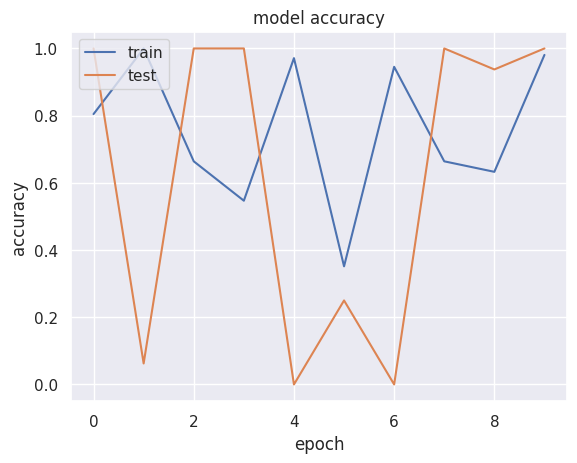

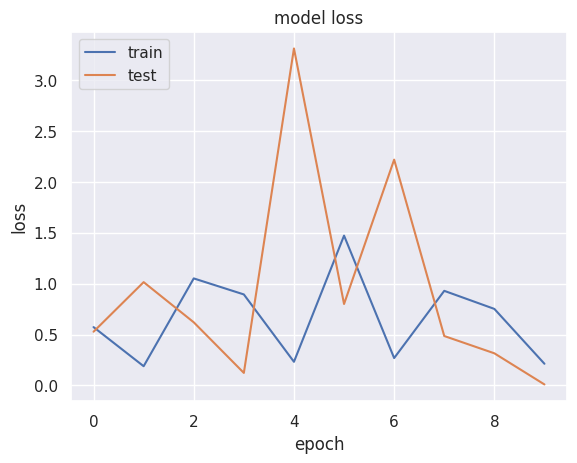

In [91]:
import matplotlib.pyplot as plt
plt.plot(history2.history['accuracy'])
plt.plot(history2.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history2.history['loss'])
plt.plot(history2.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# MobileNet

In [92]:
def MobileNet_V2(input_shape = (224, 224, 3), classes = 2):
    
  # Create an instance of pre-trained mobile net model
  base_model = tf.keras.applications.MobileNetV2(input_shape=input_shape,
                                                include_top=False,
                                                weights='imagenet')

  # Add dense, dropout and batch normalization layers on the pre-trained model
  x = base_model.output
  x = GlobalAveragePooling2D()(x)
  x = Dense(256, activation='relu')(x)
  x = BatchNormalization()(x)
  x = Dropout(0.5)(x)
  predictions = Dense(classes, activation='sigmoid')(x)

  # Create final output layer with Sigmoid activation function
  model = Model(inputs=base_model.input, outputs=predictions)

  # Change batch size, activation function and optimize as rmsprop
  model.compile(optimizer='rmsprop', loss='binary_crossentropy', metrics=['accuracy'])

  return model

model = MobileNet_V2()
model.summary()

Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_10 (InputLayer)          [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_10[0][0]']               
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                           

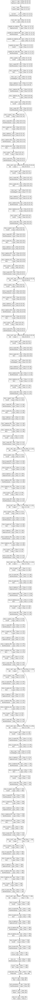

In [93]:

tf.keras.utils.plot_model(model, to_file='model_3.png', show_shapes=True, show_layer_names=True)

In [94]:
# Use early stopping with the patience of two epoch and call back function for preventing overfitting
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=2)

# Train the model using a generator and test accuracy of test data at every epoch
history = model.fit_generator(
        train_generator,
        steps_per_epoch=train_generator.samples // train_generator.batch_size,
        epochs=10,
        validation_data=test_generator,
        validation_steps=test_generator.samples // test_generator.batch_size,
        callbacks=[early_stopping])


<ipython-input-94-3ff4647e627d>:5: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(


Epoch 1/10
19/19 [==============================] - 23s 641ms/step - loss: 1.0126 - accuracy: 0.4829 - val_loss: 0.8230 - val_accuracy: 0.6562
Epoch 2/10
19/19 [==============================] - 10s 483ms/step - loss: 0.8678 - accuracy: 0.5086 - val_loss: 0.9608 - val_accuracy: 0.6562
Epoch 3/10
19/19 [==============================] - 11s 573ms/step - loss: 0.8998 - accuracy: 0.4846 - val_loss: 0.9475 - val_accuracy: 0.6562


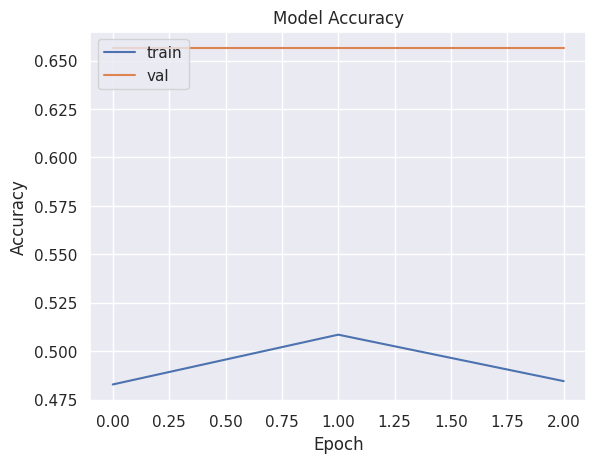

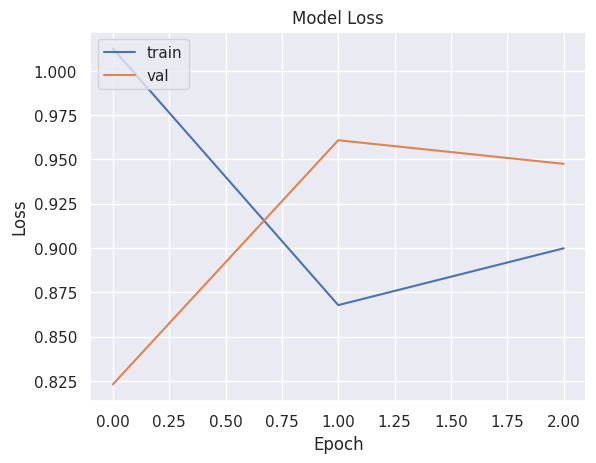

In [95]:
# Plot training and validation accuracy and loss
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

     

In [96]:
# Print precision, recall, and F1-score for all classes

test_generator.reset()
y_pred3 = model.predict(test_generator)
y_true3 = test_generator.classes
class_labels = list(test_generator.class_indices.keys())
print(classification_report(y_true3, y_pred3.argmax(axis=1), target_names=class_labels))

7/7 [==============================] - 2s 157ms/step
              precision    recall  f1-score   support

   with_mask       0.00      0.00      0.00        66
without_mask       0.67      1.00      0.80       132

    accuracy                           0.67       198
   macro avg       0.33      0.50      0.40       198
weighted avg       0.44      0.67      0.53       198



/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [97]:
# Print precision, recall, and F1-score for all classes
from sklearn.metrics import classification_report

val_generator.reset()
y_predict = model.predict(val_generator)
y_true_ = val_generator.classes
class_labels = list(val_generator.class_indices.keys())
print(classification_report(y_true_, y_predict.argmax(axis=1), target_names=class_labels))

5/5 [==============================] - 2s 436ms/step
              precision    recall  f1-score   support

   with_mask       0.00      0.00      0.00        62
without_mask       0.55      1.00      0.71        75

    accuracy                           0.55       137
   macro avg       0.27      0.50      0.35       137
weighted avg       0.30      0.55      0.39       137



/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# VGG16 

In [98]:
def vgg16(input_shape = (224, 224, 3), classes = 2):
    
  # Create an instance of pre-trained mobile net model
  base_model = tf.keras.applications.VGG16(input_shape=input_shape,
                                                include_top=False,
                                                weights='imagenet')

  # Add dense, dropout and batch normalization layers on the pre-trained model
  x = base_model.output
  x = GlobalAveragePooling2D()(x)
  x = Dense(256, activation='relu')(x)
  x = BatchNormalization()(x)
  x = Dropout(0.5)(x)
  predictions = Dense(classes, activation='sigmoid')(x)

  # Create final output layer with Sigmoid activation function
  model = Model(inputs=base_model.input, outputs=predictions)

  # Change batch size, activation function and optimize as rmsprop
  model.compile(optimizer='rmsprop', loss='binary_crossentropy', metrics=['accuracy'])

  return model

model_vgg16 = vgg16()
model_vgg16.summary()

Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_11 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

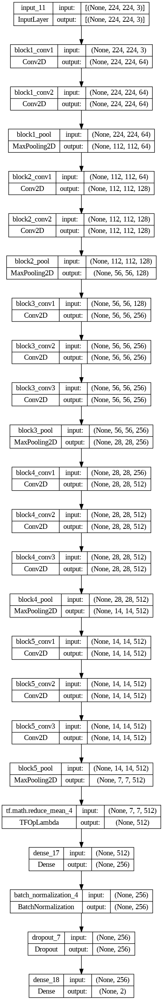

In [99]:

tf.keras.utils.plot_model(model_vgg16, to_file='model_4.png', show_shapes=True, show_layer_names=True)

In [100]:
# Use early stopping with the patience of two epoch and call back function for preventing overfitting
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=2)

# Train the model using a generator and test accuracy of test data at every epoch
history = model_vgg16.fit_generator(
        train_generator,
        steps_per_epoch=train_generator.samples // train_generator.batch_size,
        epochs=10,
        validation_data=test_generator,
        validation_steps=test_generator.samples // test_generator.batch_size,
        callbacks=[early_stopping])


<ipython-input-100-ecfa5a9c9980>:5: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model_vgg16.fit_generator(


Epoch 1/10
19/19 [==============================] - 82s 4s/step - loss: 0.8277 - accuracy: 0.4743 - val_loss: 5328.3784 - val_accuracy: 0.3438
Epoch 2/10
19/19 [==============================] - 82s 4s/step - loss: 0.8100 - accuracy: 0.4760 - val_loss: 1.2930 - val_accuracy: 0.6562
Epoch 3/10
19/19 [==============================] - 78s 4s/step - loss: 0.8029 - accuracy: 0.4846 - val_loss: 0.6705 - val_accuracy: 0.6458
Epoch 4/10
19/19 [==============================] - 83s 4s/step - loss: 0.7611 - accuracy: 0.5291 - val_loss: 7.4713 - val_accuracy: 0.3750
Epoch 5/10
19/19 [==============================] - 82s 4s/step - loss: 0.7738 - accuracy: 0.4983 - val_loss: 12.1000 - val_accuracy: 0.3438


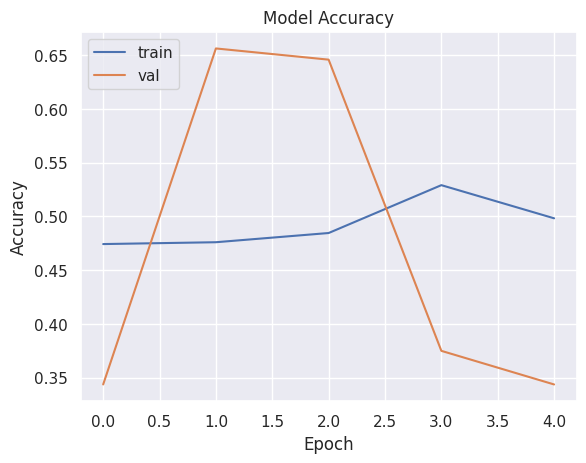

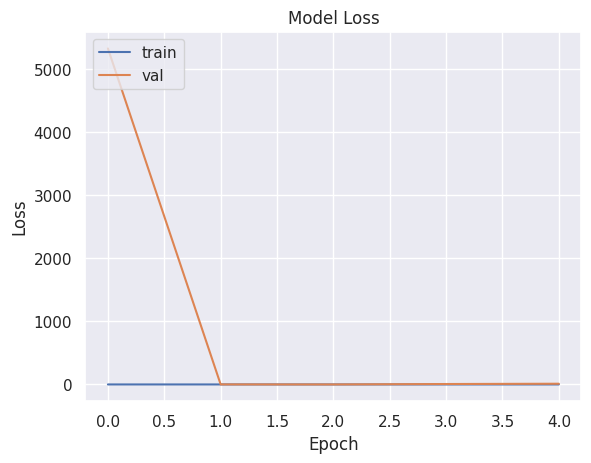

In [101]:
# Plot training and validation accuracy and loss
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

     

In [102]:
# Print precision, recall, and F1-score for all classes

test_generator.reset()
y_pred4 = model.predict(test_generator)
y_true4 = test_generator.classes
class_labels = list(test_generator.class_indices.keys())
print(classification_report(y_true4, y_pred4.argmax(axis=1), target_names=class_labels))

7/7 [==============================] - 1s 160ms/step
              precision    recall  f1-score   support

   with_mask       0.00      0.00      0.00        66
without_mask       0.67      1.00      0.80       132

    accuracy                           0.67       198
   macro avg       0.33      0.50      0.40       198
weighted avg       0.44      0.67      0.53       198



/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [103]:
# Print precision, recall, and F1-score for all classes
from sklearn.metrics import classification_report

val_generator.reset()
y_predict = model_vgg16.predict(val_generator)
y_true_ = val_generator.classes
class_labels = list(val_generator.class_indices.keys())
print(classification_report(y_true_, y_predict.argmax(axis=1), target_names=class_labels))

5/5 [==============================] - 6s 947ms/step
              precision    recall  f1-score   support

   with_mask       0.45      1.00      0.62        62
without_mask       0.00      0.00      0.00        75

    accuracy                           0.45       137
   macro avg       0.23      0.50      0.31       137
weighted avg       0.20      0.45      0.28       137



/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# EfficientNetB0

In [104]:
def EfficientNetB0(input_shape = (224, 224, 3), classes = 2):
    
  # Create an instance of pre-trained mobile net model
  base_model = tf.keras.applications.EfficientNetB0(input_shape=input_shape,
                                                include_top=False,
                                                weights='imagenet')

  # Add dense, dropout and batch normalization layers on the pre-trained model
  x = base_model.output
  x = GlobalAveragePooling2D()(x)
  x = Dense(256, activation='relu')(x)
  x = BatchNormalization()(x)
  x = Dropout(0.5)(x)
  predictions = Dense(classes, activation='sigmoid')(x)

  # Create final output layer with Sigmoid activation function
  model = Model(inputs=base_model.input, outputs=predictions)

  # Change batch size, activation function and optimize as rmsprop
  model.compile(optimizer='rmsprop', loss='binary_crossentropy', metrics=['accuracy'])

  return model

model_alex = EfficientNetB0()
model_alex.summary()

Model: "model_8"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_12 (InputLayer)          [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling_2 (Rescaling)        (None, 224, 224, 3)  0           ['input_12[0][0]']               
                                                                                                  
 normalization_1 (Normalization  (None, 224, 224, 3)  7          ['rescaling_2[0][0]']            
 )                                                                                                
                                                                                            

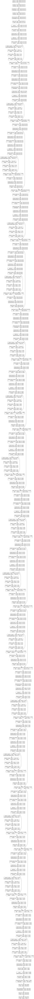

In [105]:

tf.keras.utils.plot_model(model_alex, to_file='model_5.png', show_shapes=True, show_layer_names=True)

In [106]:
# Use early stopping with the patience of two epoch and call back function for preventing overfitting
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=2)

# Train the model using a generator and test accuracy of test data at every epoch
history = model_alex.fit_generator(
        train_generator,
        steps_per_epoch=train_generator.samples // train_generator.batch_size,
        epochs=10,
        validation_data=test_generator,
        validation_steps=test_generator.samples // test_generator.batch_size,
        callbacks=[early_stopping])


<ipython-input-106-aef79a709f4d>:5: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model_alex.fit_generator(


Epoch 1/10
19/19 [==============================] - 37s 898ms/step - loss: 1.0096 - accuracy: 0.5257 - val_loss: 0.6925 - val_accuracy: 0.6667
Epoch 2/10
19/19 [==============================] - 14s 713ms/step - loss: 1.0012 - accuracy: 0.4846 - val_loss: 0.6701 - val_accuracy: 0.6562
Epoch 3/10
19/19 [==============================] - 14s 714ms/step - loss: 0.9560 - accuracy: 0.4777 - val_loss: 0.6766 - val_accuracy: 0.6562
Epoch 4/10
19/19 [==============================] - 13s 699ms/step - loss: 0.8960 - accuracy: 0.4966 - val_loss: 0.6867 - val_accuracy: 0.6562


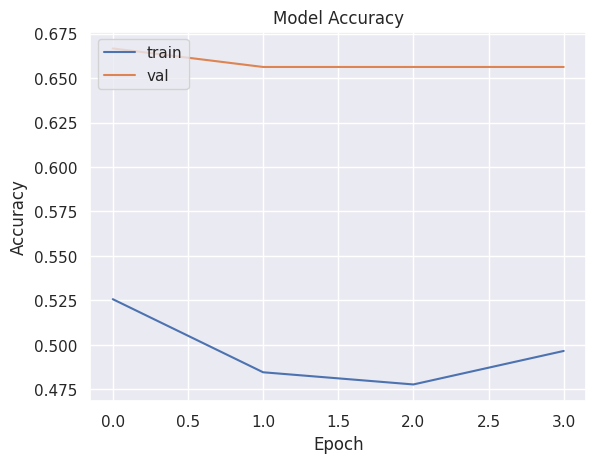

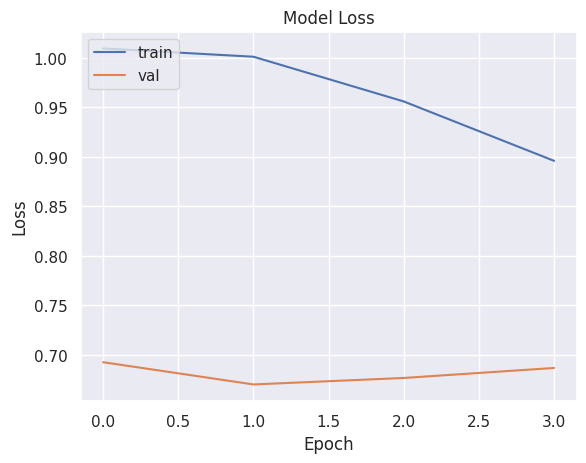

In [107]:
# Plot training and validation accuracy and loss
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

     

In [108]:
# Print precision, recall, and F1-score for all classes

test_generator.reset()
y_pred5 = model_alex.predict(test_generator)
y_true5 = test_generator.classes
class_labels = list(test_generator.class_indices.keys())
print(classification_report(y_true5, y_pred5.argmax(axis=1), target_names=class_labels))

7/7 [==============================] - 4s 277ms/step
              precision    recall  f1-score   support

   with_mask       0.00      0.00      0.00        66
without_mask       0.67      1.00      0.80       132

    accuracy                           0.67       198
   macro avg       0.33      0.50      0.40       198
weighted avg       0.44      0.67      0.53       198



/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [109]:
# Print precision, recall, and F1-score for all classes
from sklearn.metrics import classification_report

val_generator.reset()
y_predict = model_alex.predict(val_generator)
y_true_ = val_generator.classes
class_labels = list(val_generator.class_indices.keys())
print(classification_report(y_true_, y_predict.argmax(axis=1), target_names=class_labels))

5/5 [==============================] - 2s 434ms/step
              precision    recall  f1-score   support

   with_mask       0.00      0.00      0.00        62
without_mask       0.55      1.00      0.71        75

    accuracy                           0.55       137
   macro avg       0.27      0.50      0.35       137
weighted avg       0.30      0.55      0.39       137



/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


the best model in dealing with the data is DenseNet so this is the model which ready for the deployment

# Deployment

In [110]:
import joblib
joblib.dump(model, 'model.joblib')

['model.joblib']

In [111]:
model.save('finalmodel.h5')

In [112]:
import pickle
filename = 'finalized_model.sav'
pickle.dump(model, open(filename, 'wb'))

easly we can use one of those file foe integration and make user interface 

# Real Time trial for the Project

In [113]:
import imageio as iio

In [204]:
trial_image=iio.imread("/content/golden_sq-82da7bacbf7d59a96fd6a6ef5fedd80e4acb95aa-s1100-c50.jpg")

<ipython-input-204-5d71056dfe27>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  trial_image=iio.imread("/content/golden_sq-82da7bacbf7d59a96fd6a6ef5fedd80e4acb95aa-s1100-c50.jpg")


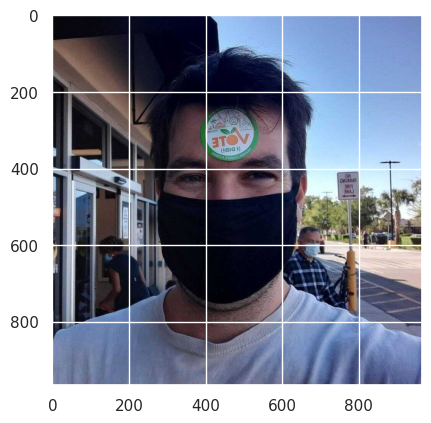

In [205]:
plt.imshow(trial_image)

In [206]:
def prepare_image(img):
                image = tf.image.resize(img, [224, 224])
                image = tf.expand_dims(image, axis=0)
                rescal_layer = tf.keras.layers.Rescaling(scale=1. / 255)
                image = rescal_layer(image)
                return image

In [207]:
prepared_input=prepare_image(trial_image)

In [208]:
out = model.predict(prepared_input)
final_output = out.argmax(axis=1)

1/1 [==============================] - 0s 64ms/step


In [210]:
print(final_output)

[1]


In [211]:
if final_output==1:
  print("the image is classified as containing mask")
else :
  print("the image is classified as no mask")

the image is classified as containing mask


the end of the project 